# Distribution of phage genome sizes

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import EngFormatter
import plotly.express as px
pixels = 1/plt.rcParams['figure.dpi']  # pixel in inches
plt.rcParams['font.family'] = 'Helvetica'

## Quick curation
### Selecting phage genomes
The new taxonomy doesn't have a specific way to filter phages. This is my quick filtering attempt:
- Get all families that have and `Organism_Name` with the word 'phage'.
- Then, check those families to see what proportion of the family has organisms with 'phage' in the name.
- Select list of Families to plot

In [2]:
df_2025 = pd.read_table('data/20250512_ncbivirus.tsv', 
                        sep='\t', 
                        low_memory=False)

In [3]:
family_counts = []

families_with_phage = df_2025[df_2025['Organism_Name'].str.contains('phage')]['Family'].dropna().unique()

for family in families_with_phage:
    df_sub = df_2025[df_2025['Family'] == family]
    total = len(df_sub)
    phage_proportion = df_sub['Organism_Name'].str.contains('phage').sum()/total
    family_counts.append([family, phage_proportion, total])

df_phage_fams = pd.DataFrame(family_counts, columns=['family', 'proportion_phage', 'total_n_family'])
df_phage_fams = df_phage_fams.sort_values('proportion_phage')

In [5]:
# family inclusion data
df_cur = pd.read_csv('data/2025_curation.tsv', sep='\t')
included_families = df_cur[df_cur['included']]['family'].to_list()
df_cur.head()

,family,proportion_phage,total_n_family,included,note
0,Rudiviridae,0.03,31,False,Archaeal viruses
1,Microviridae,0.10,7242,True,"Phage family, many uncultured, so no host spec..."
2,Bicaudaviridae,0.11,18,False,Archaeal viruses
3,Graaviviridae,0.20,5,False,Archaeal viruses
4,Hafunaviridae,0.31,52,False,Archaeal viruses


In [6]:
df_phage = df_2025[df_2025['Family'].isin(included_families)]

In [7]:
df_phage.head()

,Accession,Organism_Name,Release_Date,Species,Family,Molecule_type,Length,Nuc_Completeness,Geo_Location,Host
0,NC_049378,Salmonella phage ST-W77,2020-07-03,Kuttervirus STW77,Ackermannviridae,dsDNA,157458,complete,NaN,Salmonella
1,NC_049382,Salmonella phage BSP101,2020-07-03,Kuttervirus BSP101,Ackermannviridae,dsDNA,157665,complete,Korea: Seoul,Salmonella enterica
2,NC_049384,Enterobacter phage EspM4VN,2020-07-03,Agtrevirus EM4,Ackermannviridae,dsDNA,160766,complete,Viet Nam,Enterobacter asburiae
3,NC_049396,Salmonella phage SP1,2020-07-03,Kuttervirus SP1,Ackermannviridae,dsDNA,156585,complete,NaN,Salmonella enterica subsp. enterica serovar Pu...
4,NC_049427,Escherichia phage FEC14,2020-07-03,Kuttervirus FEC14,Ackermannviridae,dsDNA,158639,complete,China: First Hospital of Jilin University,Escherichia coli O157:H7


### Special cases
#### Cystoviridae
These phages have fragmented genomes, so there's a need to merge them into a single record, for plotting the size.

In [8]:
df_cys = df_phage[df_phage['Family'] == 'Cystoviridae'].copy()
df_cys['Accession_Number'] = df_cys['Accession'].str.extract(r'(\d+)$').astype(int)
df_cys.sort_values(['Organism_Name', 'Accession_Number'], inplace=True)

In [9]:
def assign_groups(series, group_size=3):
    diffs = series.diff().fillna(1) != 1
    split_points = diffs.cumsum()

    groups = []
    for _, group in series.groupby(split_points):
        group_list = group.tolist()
        for i in range(0, len(group_list), group_size):
            if i + group_size <= len(group_list):
                groups.extend([len(groups) // group_size] * group_size)
            else:
                groups.extend([-1] * (len(group_list) - i))
    return groups

df_cys['group'] = assign_groups(df_cys['Accession_Number'])

In [10]:
df_cys_aggreg = (df_cys.groupby(['Organism_Name','group']).agg({'Accession': lambda x: ','.join(sorted(set(x))),
                                                                'Release_Date': lambda x: ','.join(sorted(set(x.astype(str)))),
                                                                'Species': lambda x: ','.join(sorted(set(x))),
                                                                'Family': lambda x: ','.join(sorted(set(x))),
                                                                'Molecule_type': lambda x: ','.join(sorted(set(x))),
                                                                'Length': 'sum',
                                                                'Nuc_Completeness': lambda x: ','.join(sorted(set(x))),
                                                                'Geo_Location': lambda x: ','.join(sorted(set(x.dropna().astype(str)))),
                                                                'Host': lambda x: ','.join(sorted(set(x.dropna().astype(str))))}).reset_index())

In [11]:
df_cys_aggreg = df_cys_aggreg.drop(columns=['group'])

In [12]:
df_phage = df_phage[df_phage['Family'] != 'Cystoviridae']
df_phage = pd.concat([df_phage, df_cys_aggreg], ignore_index=True)

In [13]:
df_phage

,Accession,Organism_Name,Release_Date,Species,Family,Molecule_type,Length,Nuc_Completeness,Geo_Location,Host
0,NC_049378,Salmonella phage ST-W77,2020-07-03,Kuttervirus STW77,Ackermannviridae,dsDNA,157458,complete,NaN,Salmonella
1,NC_049382,Salmonella phage BSP101,2020-07-03,Kuttervirus BSP101,Ackermannviridae,dsDNA,157665,complete,Korea: Seoul,Salmonella enterica
2,NC_049384,Enterobacter phage EspM4VN,2020-07-03,Agtrevirus EM4,Ackermannviridae,dsDNA,160766,complete,Viet Nam,Enterobacter asburiae
3,NC_049396,Salmonella phage SP1,2020-07-03,Kuttervirus SP1,Ackermannviridae,dsDNA,156585,complete,NaN,Salmonella enterica subsp. enterica serovar Pu...
4,NC_049427,Escherichia phage FEC14,2020-07-03,Kuttervirus FEC14,Ackermannviridae,dsDNA,158639,complete,China: First Hospital of Jilin University,Escherichia coli O157:H7
...,...,...,...,...,...,...,...,...,...,...
17328,"NC_042068,NC_042069,NC_042070",Pseudomonas phage phiNN,2019-05-02,Cystovirus phiNN,Cystoviridae,dsRNA,13262,complete,,Pseudomonas sp.
17329,"KJ957164,KJ957165,KJ957166",Pseudomonas phage phiNN,2015-02-04,Cystovirus phiNN,Cystoviridae,dsRNA,13262,complete,,Pseudomonas sp.
17330,"NC_042071,NC_042072,NC_042073",Pseudomonas phage phiYY,2019-05-02,Cystovirus phiYY,Cystoviridae,dsRNA,13514,complete,,Pseudomonas aeruginosa
17331,"KX074201,KX074202,KX074203",Pseudomonas phage phiYY,2017-04-10,Cystovirus phiYY,Cystoviridae,dsRNA,13514,complete,,Pseudomonas aeruginosa


## Plotting

In [14]:
# fix molecule type
replace_mol_type = {'ssDNA(+)':'ssDNA',
                    'RNA': 'ssRNA',
                    'ssRNA(+)': 'ssRNA'}
df_phage['genome_mol'] = df_phage['Molecule_type'].replace(replace_mol_type)

# molecule type colors
color_dict = {'ssRNA': '#d665a4',
              'ssRNA':'#d665a4',
              'ssDNA':'#c22823',
              'dsRNA':'#424cbd',
              'dsDNA': '#118550',
              'unknown': 'gray'}

In [15]:
# order families by mean genome length
fam_order = df_phage.groupby(['Family'])['Length'].mean().sort_values(ascending=False).index.to_list()

### Static plot

In [21]:
means

Family
Arenbergviridae        286879.000000
Kleczkowskaviridae     207222.000000
Kyanoviridae           184330.691038
Straboviridae          170809.025939
Ackermannviridae       155798.134328
Pootjesviridae         153387.523810
Herelleviridae         145240.183183
Stanwilliamsviridae    131386.783019
Molycolviridae         124631.750000
Demerecviridae         113000.239496
Steigviridae            99968.800000
Suoliviridae            99370.916667
Intestiviridae          94369.160000
Crevaviridae            91473.000000
Grimontviridae          88721.846154
Vilmaviridae            76345.294574
Pachyviridae            74320.000000
Schitoviridae           73555.261128
Naomviridae             73406.000000
Pervagoviridae          72787.714286
Zierdtviridae           66966.895349
Casjensviridae          60152.532710
Mesyanzhinovviridae     59910.172414
Vertoviridae            57550.500000
Assiduviridae           54760.571429
Chaseviridae            53375.785714
Drexlerviridae          49030.6

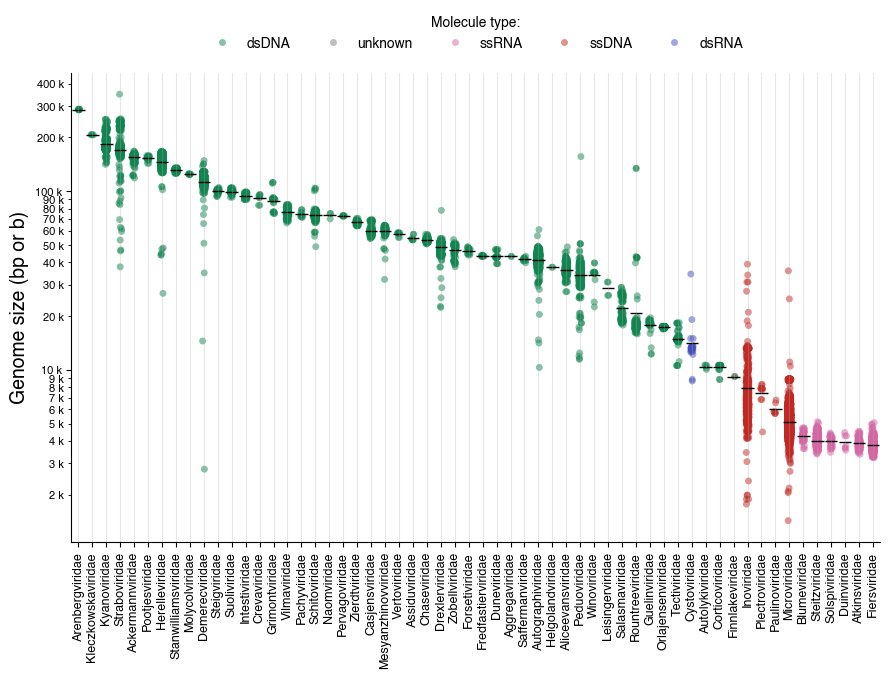

In [48]:
fig_s, ax = plt.subplots(1, 1, figsize=(900*pixels,700*pixels))

# make striplot
sns.stripplot(data=df_phage,
              x='Family',
              y='Length',
              ax=ax,
              zorder=0,
              palette=color_dict,
              alpha=.5,
              hue='genome_mol',
              order=fam_order)

means = df_phage.groupby('Family')['Length'].mean().reindex(fam_order)
x_positions = {family: i for i, family in enumerate(fam_order)}

# Draw horizontal mean lines at each category
for family in fam_order:
    x = x_positions[family]
    mean_val = means[family]
    ax.hlines(y=mean_val,
              zorder=1,
              xmin=x - 0.45, xmax=x + 0.45,  # Adjust line width to match box width
              colors='black',
              linestyles='-',
              linewidth=1)
# asthetics
sns.despine()

plt.gca().set_yscale('log')

plt.xlabel('Family', fontsize=14)
plt.xticks(rotation=90)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.grid(axis='x', alpha=.3)

plt.ylabel('Genome size (bp or b)', fontsize=14)
plt.xlabel('')
plt.xlim(-.5,57.5)
ax.yaxis.set_minor_formatter(EngFormatter())
for axis in [ax.yaxis]:
    axis.set_major_formatter(EngFormatter())
plt.tick_params(axis='y', which='both', labelsize=8)
plt.tick_params(axis='x', which='major', labelsize=9)
ax.legend(title='Molecule type:', loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=5, frameon=False)
plt.tight_layout()
plt.savefig('data/pngs/2025.png', format='png')
plt.show()

# Dynamic plot

In [24]:
x_map = {fam: i for i, fam in enumerate(fam_order)}
means = df_phage.groupby('Family')['Length'].mean().reset_index()

# strip plot
fig = px.strip(df_phage,
               x='Family',
               y='Length',
               custom_data=['Accession', 'Organism_Name'],
               color_discrete_map=color_dict,
               category_orders=dict(Family=fam_order),
               color='genome_mol',
               stripmode='overlay',
               log_y=True,
               width=800,
               height=600)
# marker opacity
fig.update_traces(marker=dict(opacity=0.5))

# means
for _, row in means.iterrows():
    x_center = x_map[row['Family']]
    fig.add_shape(type='line',
                  x0 = x_center - 0.45, 
                  x1 = x_center + 0.45,
                  y0 = row['Length'], 
                  y1 = row['Length'],
                  line=dict(color='black', width=1.5),
                  xref='x', yref='y')

# x axes
fig.update_xaxes(tickangle=-90,
                 showgrid=True,
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 gridcolor='rgba(0,0,0,.2)')

# y axes
fig.update_yaxes(ticks='outside',
                 ticklen=3,
                 showgrid=False,
                 showline=True,
                 linewidth=1,
                 linecolor='black')

# legend
fig.update_layout(showlegend=True,
                  legend_title_text='Molecule type:',
                  legend=dict(orientation="h",
                              yanchor="bottom",
                              y=1.02,
                              xanchor="center",
                              x=0.5))

# hover
fig.update_traces(hovertemplate='<b>%{customdata[1]}</b><br>NCBI acc: %{customdata[0]}<br>Size: %{y}<extra></extra>',
                  marker=dict(size=6))

# general layout
fig.update_layout(xaxis_title=None,
                  yaxis_title='Genome size (bp|b)',
                  xaxis=dict(tickfont=dict(size=10)),
                  yaxis=dict(tickfont=dict(size=12)),
                  font=dict(family="Open+Sans"),
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  margin=dict(l=0, r=0, t=60, b=110))

# modebar
# fig.write_html('data/htmls/2025.html',
#                config={'modeBarButtonsToRemove': ['zoom2d', 'pan2d', 'lasso2d', 'select2d', 'autoScale2d'],
#                        'displaylogo': False})


fig.show()